# 12 Active Learning With CRN Conditioning

This variant of notebook 11 tests learning as a stateful CRN process rather than as a neural-network update.

Desired behavior:

* Before CRN conditioning, correlated and uncorrelated signals both produce zero output.
* After a long correlated conditioning signal, the same CRN state responds to a correlated test signal.
* After a long uncorrelated conditioning signal, the CRN does not learn and still produces zero output even when tested with a correlated signal.


## Step 1: imports

In [1]:
from typing import Any, Callable, Dict, List

import matplotlib.pyplot as plt
import numpy as np

from RL4CRN.iocrns.reactions import MassAction
from RL4CRN.utils.crn_builders import build_simple_IOCRN
from RL4CRN.utils.input_interface import (
    SolverCfg,
    TaskKindBase,
    TaskSpec,
    make_task,
    register_task_kind,
    _TASK_KIND_REGISTRY,
)
from RL4CRN.utils.library_builders import build_MAK_library


## Step 2: build the CRN template and library

In [2]:
solver = SolverCfg(algorithm="CVODE", rtol=1e-8, atol=1e-10)

crn_template, species_labels = build_simple_IOCRN(
    species=["X1", "X2", "H", "O"],
    production_input_map={"X1": "cs", "X2": "s"},
    output_species="O",
    dilution_map={"H": 0.1},
    solver=solver,
)

library_components = build_MAK_library(
    crn_template=crn_template,
    species_labels=species_labels,
    order=2,
)
library, M, K, masks = library_components

ids_to_remove = [
    reaction.ID
    for reaction in library.reactions
    if len(reaction.reactant_labels) == 0
    and len(reaction.product_labels) > 0
    and reaction not in crn_template.reactions
]
library.remove_reactions(ids_to_remove, remove_by="ID")
crn_template.set_library_context(library)

library_components = (
    library,
    len(library.reactions),
    library.get_num_parameters(),
    {
        "continuous": library.get_parameter_mask(mode="continuous", force=True),
        "discrete": library.get_parameter_mask(mode="discrete", force=True),
        "logit": library.get_logit_mask(force=True),
    },
)

print(library)
print(f"Removed {len(ids_to_remove)} spontaneous production reactions from the library.")


Number of reactions: 199
R0: ∅ ----> ∅;  [MAK(None)]
R1: ∅ ----> X1;  [MAK(None)]
R2: ∅ ----> X2;  [MAK(None)]
R3: X1 ----> ∅;  [MAK(None)]
R4: X1 ----> X2;  [MAK(None)]
R5: X1 ----> H;  [MAK(None)]
R6: X1 ----> O;  [MAK(None)]
R7: X1 ----> X1 + X1;  [MAK(None)]
R8: X1 ----> X1 + X2;  [MAK(None)]
R9: X1 ----> H + X1;  [MAK(None)]
R10: X1 ----> O + X1;  [MAK(None)]
R11: X1 ----> X2 + X2;  [MAK(None)]
R12: X1 ----> H + X2;  [MAK(None)]
R13: X1 ----> O + X2;  [MAK(None)]
R14: X1 ----> H + H;  [MAK(None)]
R15: X1 ----> H + O;  [MAK(None)]
R16: X1 ----> O + O;  [MAK(None)]
R17: X2 ----> ∅;  [MAK(None)]
R18: X2 ----> X1;  [MAK(None)]
R19: X2 ----> H;  [MAK(None)]
R20: X2 ----> O;  [MAK(None)]
R21: X2 ----> X1 + X1;  [MAK(None)]
R22: X2 ----> X1 + X2;  [MAK(None)]
R23: X2 ----> H + X1;  [MAK(None)]
R24: X2 ----> O + X1;  [MAK(None)]
R25: X2 ----> X2 + X2;  [MAK(None)]
R26: X2 ----> H + X2;  [MAK(None)]
R27: X2 ----> O + X2;  [MAK(None)]
R28: X2 ----> H + H;  [MAK(None)]
R29: X2 ----> H + O;  

## Step 3: protocol helpers

In [3]:
def sample_interval_events(n, time_sampler, length_sampler, value, *, rng=None, min_length=0.0):
    rng = np.random.default_rng(rng)
    starts = np.asarray(time_sampler(rng, n), dtype=float)
    lengths = np.maximum(np.asarray(length_sampler(rng, n), dtype=float), min_length)
    intervals = sorted(
        (max(0.0, s), s + length)
        for s, length in zip(starts, lengths)
        if length > 0 and s + length > 0
    )

    merged = []
    for start, end in intervals:
        if not merged or start > merged[-1][1]:
            merged.append([start, end])
        else:
            merged[-1][1] = max(merged[-1][1], end)

    events = []
    for start, end in merged:
        events.append((float(start), float(value)))
        events.append((float(end), 0.0))
    return events


def combine_piecewise_events(seq_a, seq_b, default_a=0.0, default_b=0.0):
    events = [(float(t), "a", v) for t, v in seq_a]
    events.extend((float(t), "b", v) for t, v in seq_b)
    events.sort(key=lambda x: x[0])

    out = []
    val_a = default_a
    val_b = default_b
    i = 0
    while i < len(events):
        t = events[i][0]
        while i < len(events) and np.isclose(events[i][0], t):
            _, which, value = events[i]
            if which == "a":
                val_a = value
            else:
                val_b = value
            i += 1
        pair = (val_a, val_b)
        if out and out[-1][1] == pair:
            out[-1] = (t, pair)
        else:
            out.append((t, pair))
    return out


def _sampler_from_spec(spec):
    if callable(spec):
        return spec
    if isinstance(spec, (int, float)):
        value = float(spec)
        return lambda rng, n: np.full(n, value, dtype=float)
    if isinstance(spec, str):
        allowed = {"np": np}
        def sampler(rng, n):
            values = []
            for _ in range(n):
                allowed["rng"] = rng
                values.append(float(eval(spec, {"__builtins__": {}}, allowed)))
            return np.asarray(values, dtype=float)
        return sampler
    raise TypeError(f"Unsupported sampler spec: {spec!r}")


def _events_to_piecewise_protocol(events, end_time, n_t_per_interval, n_inputs=2):
    current = np.zeros(n_inputs, dtype=np.float32)
    breakpoints = [0.0]
    values = []

    for t, event_value in sorted(events, key=lambda item: item[0]):
        t = float(t)
        if t < 0.0 or t > end_time:
            continue
        if t > breakpoints[-1]:
            values.append(current.copy())
            breakpoints.append(t)
        current = np.asarray(event_value, dtype=np.float32).reshape(n_inputs)

    if end_time > breakpoints[-1]:
        values.append(current.copy())
        breakpoints.append(float(end_time))

    u_sequence = []
    nested_time_horizon = []
    for start, end, value in zip(breakpoints[:-1], breakpoints[1:], values):
        duration = float(end - start)
        if duration <= 0.0:
            continue
        u_sequence.append(value)
        nested_time_horizon.append(np.linspace(0.0, duration, n_t_per_interval, dtype=np.float32))

    if not u_sequence:
        u_sequence = [current.copy()]
        nested_time_horizon = [np.linspace(0.0, float(end_time), n_t_per_interval, dtype=np.float32)]

    return u_sequence, nested_time_horizon


def _sample_active_learning_protocol(rng, *, n_peaks, horizon, amplitude, start_sampler, length_sampler, delay_sampler, correlated, n_t_per_interval):
    cs_events = sample_interval_events(
        n=n_peaks,
        time_sampler=start_sampler,
        length_sampler=length_sampler,
        value=amplitude,
        rng=rng,
        min_length=1e-6,
    )

    if correlated:
        cs_on_events = [(t, v) for t, v in cs_events if v != 0.0]
        starts = np.asarray([t for t, _ in cs_on_events], dtype=float)
        delays = np.asarray(delay_sampler(rng, len(starts)), dtype=float)
        lengths = np.maximum(np.asarray(length_sampler(rng, len(starts)), dtype=float), 1e-6)
        s_starts = np.clip(starts + np.maximum(delays, 0.0), 0.0, horizon)
        intervals = sorted(
            (float(start), float(min(start + length, horizon)))
            for start, length in zip(s_starts, lengths)
            if start < horizon and length > 0.0
        )
        s_events = []
        for start, end in intervals:
            s_events.append((start, amplitude))
            s_events.append((end, 0.0))
    else:
        s_events = sample_interval_events(
            n=n_peaks,
            time_sampler=start_sampler,
            length_sampler=length_sampler,
            value=amplitude,
            rng=rng,
            min_length=1e-6,
        )

    combined_events = combine_piecewise_events(cs_events, s_events, default_a=0.0, default_b=0.0)
    u_sequence, nested_time_horizon = _events_to_piecewise_protocol(
        combined_events,
        end_time=horizon,
        n_t_per_interval=n_t_per_interval,
        n_inputs=2,
    )
    return combined_events, u_sequence, nested_time_horizon


def _target_trace_from_protocol(u_sequence, nested_time_horizon, *, input_index):
    pieces = []
    for u_step, t_segment in zip(u_sequence, nested_time_horizon):
        value = float(np.asarray(u_step, dtype=float).reshape(-1)[input_index])
        pieces.append(np.full(len(t_segment), value, dtype=float))
    return np.concatenate(pieces) if pieces else np.empty((0,), dtype=float)


## Step 4: define the conditioning TaskKind

In [4]:
_TASK_KIND_REGISTRY.pop("active_learning_conditioning", None)


@register_task_kind
class ActiveLearningConditioningTaskKind(TaskKindBase):
    kind = "active_learning_conditioning"

    @staticmethod
    def help() -> Dict[str, Any]:
        return {
            "required": {
                "start_distribution": "Sampler for interval start times.",
                "duration_distribution": "Sampler for interval lengths.",
                "correlation_delay_distribution": "Sampler for S delay after CS in correlated protocols.",
                "test_horizon": "Duration of each pre/post test protocol.",
                "conditioning_horizon": "Duration of the long CRN conditioning protocol.",
                "n_samples": "Number of sampled conditioning assays.",
                "n_test_peaks": "Number of intervals in each test protocol.",
                "n_conditioning_peaks": "Number of intervals in each conditioning protocol.",
            },
            "optional": {
                "pulse_amplitude": "Input amplitude during each interval. Default: 1.0.",
                "pre_correlated_weight": "Weight for pre-test correlated O-vs-0 error. Default: 1.0.",
                "pre_uncorrelated_weight": "Weight for pre-test uncorrelated O-vs-0 error. Default: 1.0.",
                "post_correlated_weight": "Weight for post-test after correlated conditioning O-vs-S error. Default: 1.0.",
                "post_uncorrelated_weight": "Weight for post-test after uncorrelated conditioning O-vs-0 error. Default: 1.0.",
                "test_start_distribution": "Optional start-time sampler for pre/post test protocols. Defaults to start_distribution.",
                "conditioning_start_distribution": "Optional start-time sampler for conditioning protocols. Defaults to start_distribution.",
                "conditioning_output_weight": "Optional weight penalizing output during conditioning. Default: 0.0.",
                "n_t_per_interval": "Simulation points per constant-input interval. Default: 25.",
                "seed": "Optional RNG seed for reproducible protocol sampling.",
                "ic": "Initial condition specification. Default: zero.",
            },
        }

    def validate(self, task: TaskSpec) -> None:
        required = (
            "start_distribution",
            "duration_distribution",
            "correlation_delay_distribution",
            "test_horizon",
            "conditioning_horizon",
            "n_samples",
            "n_test_peaks",
            "n_conditioning_peaks",
        )
        for key in required:
            if key not in task.params:
                raise ValueError(f"active_learning_conditioning task requires params[{key!r}].")

        if task.n_inputs != 2:
            raise ValueError("active_learning_conditioning expects exactly two input channels: CS and S.")
        if len(task.template_crn.output_labels) != 1:
            raise ValueError("active_learning_conditioning expects exactly one output species.")
        if float(task.params.get("pulse_amplitude", 1.0)) <= 0:
            raise ValueError("pulse_amplitude must be positive.")
        if float(task.params["test_horizon"]) <= 0:
            raise ValueError("test_horizon must be positive.")
        if float(task.params["conditioning_horizon"]) <= 0:
            raise ValueError("conditioning_horizon must be positive.")
        if int(task.params["n_samples"]) < 1:
            raise ValueError("n_samples must be at least 1.")
        if int(task.params["n_test_peaks"]) < 1:
            raise ValueError("n_test_peaks must be at least 1.")
        if int(task.params["n_conditioning_peaks"]) < 1:
            raise ValueError("n_conditioning_peaks must be at least 1.")
        if int(task.params.get("n_t_per_interval", 25)) < 2:
            raise ValueError("n_t_per_interval must be at least 2.")

    def default_u_list(self, task: TaskSpec) -> List[np.ndarray]:
        pulse_amplitude = float(task.params.get("pulse_amplitude", 1.0))
        return [np.array([pulse_amplitude, pulse_amplitude], dtype=np.float32)]

    def make_reward_fn(self, task: TaskSpec, overrides: Dict[str, Any]) -> Callable[[Any], Any]:
        pulse_amplitude = float(overrides.get("pulse_amplitude", task.params.get("pulse_amplitude", 1.0)))
        test_horizon = float(overrides.get("test_horizon", task.params["test_horizon"]))
        conditioning_horizon = float(overrides.get("conditioning_horizon", task.params["conditioning_horizon"]))
        n_samples = int(overrides.get("n_samples", task.params["n_samples"]))
        n_test_peaks = int(overrides.get("n_test_peaks", task.params["n_test_peaks"]))
        n_conditioning_peaks = int(overrides.get("n_conditioning_peaks", task.params["n_conditioning_peaks"]))
        n_t_per_interval = int(overrides.get("n_t_per_interval", task.params.get("n_t_per_interval", 25)))
        large_number = float(overrides.get("LARGE_NUMBER", task.params.get("LARGE_NUMBER", 1e4)))
        seed = overrides.get("seed", task.params.get("seed", None))
        weights = {
            "pre_correlated": float(overrides.get("pre_correlated_weight", task.params.get("pre_correlated_weight", 1.0))),
            "pre_uncorrelated": float(overrides.get("pre_uncorrelated_weight", task.params.get("pre_uncorrelated_weight", 1.0))),
            "post_correlated": float(overrides.get("post_correlated_weight", task.params.get("post_correlated_weight", 1.0))),
            "post_uncorrelated": float(overrides.get("post_uncorrelated_weight", task.params.get("post_uncorrelated_weight", 1.0))),
            "conditioning_output": float(overrides.get("conditioning_output_weight", task.params.get("conditioning_output_weight", 0.0))),
        }

        base_start_spec = overrides.get("start_distribution", task.params["start_distribution"])
        test_start_spec = overrides.get("test_start_distribution", task.params.get("test_start_distribution", base_start_spec))
        conditioning_start_spec = overrides.get(
            "conditioning_start_distribution",
            task.params.get("conditioning_start_distribution", base_start_spec),
        )
        test_start_sampler = _sampler_from_spec(test_start_spec)
        conditioning_start_sampler = _sampler_from_spec(conditioning_start_spec)
        length_sampler = _sampler_from_spec(overrides.get("duration_distribution", task.params["duration_distribution"]))
        delay_sampler = _sampler_from_spec(overrides.get("correlation_delay_distribution", task.params["correlation_delay_distribution"]))
        ic_obj = self.build_ic(task, overrides)

        def simulate_protocol(state: Any, *, rng, correlated: bool, horizon: float, n_peaks: int, x0: np.ndarray, start_sampler):
            events, u_sequence, nested_time_horizon = _sample_active_learning_protocol(
                rng,
                n_peaks=n_peaks,
                horizon=horizon,
                amplitude=pulse_amplitude,
                start_sampler=start_sampler,
                length_sampler=length_sampler,
                delay_sampler=delay_sampler,
                correlated=correlated,
                n_t_per_interval=n_t_per_interval,
            )
            time, x_list, y_list, _ = state.transient_response_piecewise(
                [u_sequence],
                [np.asarray(x0, dtype=np.float32)],
                nested_time_horizon,
                LARGE_NUMBER=large_number,
                force=True,
            )
            output = np.asarray(y_list[0][0], dtype=float)
            s_trace = _target_trace_from_protocol(u_sequence, nested_time_horizon, input_index=1)
            return {
                "correlated": correlated,
                "events": events,
                "u_sequence": u_sequence,
                "time": np.asarray(time, dtype=float),
                "trajectories": x_list,
                "outputs": y_list,
                "output_trace": output,
                "s_trace": s_trace,
                "final_state": np.asarray(x_list[0][:, -1], dtype=np.float32),
                "peak": float(np.nanmax(output)),
            }

        def mse_to_zero(run):
            return float(np.mean(run["output_trace"] ** 2))

        def mse_to_s(run):
            return float(np.mean((run["output_trace"] - run["s_trace"]) ** 2))

        def reward_fn(state: Any):
            rng = np.random.default_rng(seed)
            x0 = np.asarray(ic_obj.get_ic(state)[0], dtype=np.float32)
            runs = []

            for _ in range(n_samples):
                pre_corr = simulate_protocol(
                    state, rng=rng, correlated=True, horizon=test_horizon,
                    n_peaks=n_test_peaks, x0=x0, start_sampler=test_start_sampler,
                )
                pre_uncorr = simulate_protocol(
                    state, rng=rng, correlated=False, horizon=test_horizon,
                    n_peaks=n_test_peaks, x0=x0, start_sampler=test_start_sampler,
                )
                train_corr = simulate_protocol(
                    state, rng=rng, correlated=True, horizon=conditioning_horizon,
                    n_peaks=n_conditioning_peaks, x0=x0, start_sampler=conditioning_start_sampler,
                )
                post_after_corr = simulate_protocol(
                    state, rng=rng, correlated=True, horizon=test_horizon,
                    n_peaks=n_test_peaks, x0=train_corr["final_state"], start_sampler=test_start_sampler,
                )
                train_uncorr = simulate_protocol(
                    state, rng=rng, correlated=False, horizon=conditioning_horizon,
                    n_peaks=n_conditioning_peaks, x0=x0, start_sampler=conditioning_start_sampler,
                )
                post_after_uncorr = simulate_protocol(
                    state, rng=rng, correlated=True, horizon=test_horizon,
                    n_peaks=n_test_peaks, x0=train_uncorr["final_state"], start_sampler=test_start_sampler,
                )

                run = {
                    "pre_correlated": pre_corr,
                    "pre_uncorrelated": pre_uncorr,
                    "conditioning_correlated": train_corr,
                    "post_after_correlated_conditioning": post_after_corr,
                    "conditioning_uncorrelated": train_uncorr,
                    "post_after_uncorrelated_conditioning": post_after_uncorr,
                    "errors": {
                        "pre_correlated": mse_to_zero(pre_corr),
                        "pre_uncorrelated": mse_to_zero(pre_uncorr),
                        "post_correlated": mse_to_s(post_after_corr),
                        "post_uncorrelated": mse_to_zero(post_after_uncorr),
                        "conditioning_output": 0.5 * (mse_to_zero(train_corr) + mse_to_zero(train_uncorr)),
                    },
                }
                runs.append(run)

            error_means = {key: float(np.mean([run["errors"][key] for run in runs])) for key in weights}
            loss = float(sum(weights[key] * error_means[key] for key in weights))
            representative = runs[0]["post_after_correlated_conditioning"]
            state.last_task_info = {
                "type": "transient response",
                "reward": loss,
                "reward type": "active_learning_conditioning_custom_loss",
                "time_horizon": representative["time"],
                "trajectories": representative["trajectories"],
                "outputs": representative["outputs"],
                "inputs": [representative["u_sequence"]],
                "active_learning_conditioning_runs": runs,
                "error_means": error_means,
                "weights": weights,
                "pre_correlated_error": error_means["pre_correlated"],
                "pre_uncorrelated_error": error_means["pre_uncorrelated"],
                "post_correlated_error": error_means["post_correlated"],
                "post_uncorrelated_error": error_means["post_uncorrelated"],
                "post_correlated_peaks": np.array([run["post_after_correlated_conditioning"]["peak"] for run in runs], dtype=float),
                "post_uncorrelated_peaks": np.array([run["post_after_uncorrelated_conditioning"]["peak"] for run in runs], dtype=float),
                "test_horizon": test_horizon,
                "conditioning_horizon": conditioning_horizon,
            }
            return loss, state.last_task_info

        return reward_fn


In [5]:
ActiveLearningConditioningTaskKind.pretty_help()


### TaskKind `active_learning_conditioning`

**Required params**
- `start_distribution`: Sampler for interval start times.
- `duration_distribution`: Sampler for interval lengths.
- `correlation_delay_distribution`: Sampler for S delay after CS in correlated protocols.
- `test_horizon`: Duration of each pre/post test protocol.
- `conditioning_horizon`: Duration of the long CRN conditioning protocol.
- `n_samples`: Number of sampled conditioning assays.
- `n_test_peaks`: Number of intervals in each test protocol.
- `n_conditioning_peaks`: Number of intervals in each conditioning protocol.

**Optional params**
- `pulse_amplitude`: Input amplitude during each interval. Default: 1.0.
- `pre_correlated_weight`: Weight for pre-test correlated O-vs-0 error. Default: 1.0.
- `pre_uncorrelated_weight`: Weight for pre-test uncorrelated O-vs-0 error. Default: 1.0.
- `post_correlated_weight`: Weight for post-test after correlated conditioning O-vs-S error.
                            Default: 1.0.


## Step 5: construct the task

In [6]:
task = make_task(
    template_crn=crn_template,
    library_components=library_components,
    kind="active_learning_conditioning",
    species_labels=species_labels,
    params={
        "pulse_amplitude": 1.0,
        "start_distribution": lambda rng, n: rng.uniform(0.0, 24.0, size=n),
        "test_start_distribution": lambda rng, n: rng.uniform(0.0, 24.0, size=n),
        "conditioning_start_distribution": lambda rng, n: rng.uniform(0.0, 149.0, size=n),
        "duration_distribution": lambda rng, n: rng.exponential(scale=0.5, size=n),
        "correlation_delay_distribution": lambda rng, n: rng.exponential(scale=0.03, size=n),
        "test_horizon": 25.0,
        "conditioning_horizon": 150.0,
        "n_samples": 4,
        "n_test_peaks": 10,
        "n_conditioning_peaks": 45,
        "pre_correlated_weight": 1.0,
        "pre_uncorrelated_weight": 1.0,
        "post_correlated_weight": 1.0,
        "post_uncorrelated_weight": 1.0,
        "conditioning_output_weight": 0.0,
        "n_t_per_interval": 20,
        "seed": 0,
        "ic": "zero",
        "LARGE_NUMBER": 1e4,
    },
)

print("Task kind:", task.kind)
print("Default input:", task.u_list[0].tolist())
print("Test horizon:", task.params["test_horizon"])
print("Conditioning horizon:", task.params["conditioning_horizon"])


Task kind: active_learning_conditioning
Default input: [1.0, 1.0]
Test horizon: 25.0
Conditioning horizon: 150.0


## Example: score simple control candidates


In [7]:
empty_candidate = crn_template.clone()
empty_loss, empty_info = task.compute_reward(empty_candidate)

print("empty loss:", empty_loss)
print("pre correlated O~0:", empty_info["pre_correlated_error"])
print("pre uncorrelated O~0:", empty_info["pre_uncorrelated_error"])
print("post after correlated conditioning O~S:", empty_info["post_correlated_error"])
print("post after uncorrelated conditioning O~0:", empty_info["post_uncorrelated_error"])


empty loss: 0.37058399752175075
pre correlated O~0: 0.0
pre uncorrelated O~0: 0.0
post after correlated conditioning O~S: 0.37058399752175075
post after uncorrelated conditioning O~0: 0.0


In [8]:
direct_response_candidate = crn_template.clone()
direct_response_candidate.add_reaction(
    MassAction(
        reactant_labels=["X1", "X2"],
        product_labels=["X1", "X2", "O"],
        input_channels=[None],
        params=[0.3],
        params_controllability=[False],
    )
)

direct_loss, direct_info = task.compute_reward(direct_response_candidate)

print("direct-response loss:", direct_loss)
print("pre correlated O~0:", direct_info["pre_correlated_error"])
print("pre uncorrelated O~0:", direct_info["pre_uncorrelated_error"])
print("post after correlated conditioning O~S:", direct_info["post_correlated_error"])
print("post after uncorrelated conditioning O~0:", direct_info["post_uncorrelated_error"])
print("post correlated peaks:", direct_info["post_correlated_peaks"])
print("post uncorrelated-conditioned peaks:", direct_info["post_uncorrelated_peaks"])


direct-response loss: 64183300.22156169
pre correlated O~0: 141.21922365973995
pre uncorrelated O~0: 323.22906166794246
post after correlated conditioning O~S: 26474426.205614835
post after uncorrelated conditioning O~0: 37708409.56766153
post correlated peaks: [5797.06619995 5012.29596907 8297.1292313  6369.86920351]
post uncorrelated-conditioned peaks: [8018.84878544 8814.79245449 7252.86904698 6314.94377366]


## Example: plot the empty-candidate post-test target


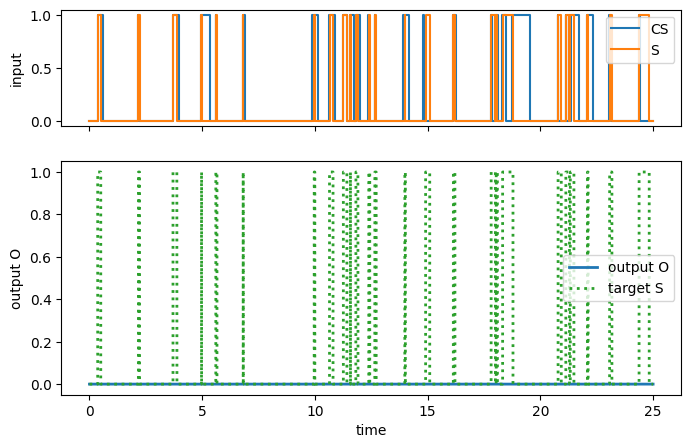

In [9]:
run = empty_info["active_learning_conditioning_runs"][0]
post = run["post_after_correlated_conditioning"]

time = post["time"]
output = post["output_trace"]
target = post["s_trace"]

fig, axes = plt.subplots(2, 1, figsize=(8, 5), sharex=True, height_ratios=[1, 2])

input_times = [0.0]
cs_values = [0.0]
s_values = [0.0]
for t, (cs, s) in post["events"]:
    input_times.append(float(t))
    cs_values.append(float(cs))
    s_values.append(float(s))
input_times.append(empty_info["test_horizon"])
cs_values.append(cs_values[-1])
s_values.append(s_values[-1])

axes[0].step(input_times, cs_values, where="post", label="CS")
axes[0].step(input_times, s_values, where="post", label="S")
axes[0].set_ylabel("input")
axes[0].legend()

axes[1].plot(time, output, color="tab:blue", linewidth=2, label="output O")
axes[1].plot(time, target, color="tab:green", linestyle=":", linewidth=2, label="target S")
axes[1].set_xlabel("time")
axes[1].set_ylabel("output O")
axes[1].legend()

plt.show()


# Training

In [10]:
from RL4CRN.utils.input_interface import Configurator

cfg = Configurator.preset("fast")
cfg.train.max_added_reactions = 5
cfg.train.epochs = 101
cfg.train.render_every = 5
cfg.train.seed = 0
cfg.render.n_best = 50
cfg.render.disregarded_percentage = 0.9
cfg.render.mode = {
    "style": "logger",
    "task": "active_learning_conditioning",
    "format": "image",
    "topology": True,
}

cfg.describe()


{'task': None,
 'solver': {'algorithm': 'CVODE', 'rtol': 1e-08, 'atol': 1e-08},
 'train': {'epochs': 101,
           'max_added_reactions': 5,
           'render_every': 5,
           'hall_of_fame_size': 30,
           'batch_multiplier': 10,
           'seed': 0,
           'n_cpus': None,
           'batch_size': None},
 'policy': {'width': 256,
            'depth': 2,
            'deep_layer_size': 512,
            'continuous_distribution': {'type': 'lognormal_1D'},
            'entropy_weights_per_head': {'structure': 2.0, 'continuous': 1.0, 'discrete': 0.0, 'input_influence': 0.0},
            'ordering_enabled': False,
            'constraint_strength': inf},
 'agent': {'learning_rate': 0.0001,
           'entropy_scheduler': {'entropy_weight': 0.001,
                                 'topk_entropy_weight': 1.0,
                                 'remainder_entropy_weight': 1.0,
                                 'entropy_update_coefficient': 1,
                                 'ent

In [11]:
import os
from datetime import datetime
from pytorch_lightning.loggers import CometLogger

from RL4CRN.utils.input_interface import make_session_and_trainer

task_name = "active_learning_conditioning_Task"
timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

api_key = os.environ["COMET_API_KEY"]
workspace = os.environ["COMET_WORKSPACE"]

logger = CometLogger(
    api_key=api_key,
    project=task_name,
    workspace=workspace,
    name=f"{task_name}_{timestamp}",
)
logger = logger.experiment

trainer = make_session_and_trainer(cfg, task, logger=logger)


COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/redsnic/active-learning-conditioning-task/b711802b9677405198f2b3a715d56cc1




[CVode, Error: -1] At t = 0.00965031169703459, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00588335759643778, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00452095928736743, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00669625282455603, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00452095928058787, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00965031168985251, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00808718197842853, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00965031169638093, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0229531109198121, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00619433671207255, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0229531108892481, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0949306084849368, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0125488394919277, mxstep steps taken b

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvHandleFailure, Error: -15] At t = 0.285659034154365, unable to satisfy inequality constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.013491386908404, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 8.17765117847071, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0499799193531509, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00238651427555033, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00576

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0112375577603031, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00113305384803189, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0011330538486449, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0112376583851766, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0434650537220784, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00145389339101384, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00145389338989979, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy cons

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00318654019490476, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00854743026889719, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00854745993057925, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00318654021134503, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00854745991996164, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0296216465917996, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00308023650949264, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0296216458110487, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t =

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0502769807396802, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00427159386407087, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0697185079672237, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00140764093164971, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0054137251625868, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0034728432643133, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0054137251699323, mxstep steps taken before reachin

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0986174010071134, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00384071779300884, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0405156723182412, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00384071772688584, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.0630712321337418 and h = 1.66751376640656e-08, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0259445822464564, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0208046187877712, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CV

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00861494886759309, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00861494886733042, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00861494885902013, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00210446607906151, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00441384048312519, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00441384048307288, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00861494886274071, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0086149488565303, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t 

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvHandleFailure, Error: -4] At t = 2.98861514083926 and h = 1.40202233556128e+301, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00321671084132023, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00946482542856631, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000878458752763818, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00087845874777281, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00256653636519409, mxstep steps taken before reaching tout.


[cvInitia

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0146064119849503, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00249188088184949, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0109415352195562, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00243073714303783, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.

[CVode, Error: -1] At t = 0.00285681572302094, mxstep steps taken before reaching tout.



[CVode, Error: -1] At t = 0.0217556324115304, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0217556323943558, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0217556324510246, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00285681572170809, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00249188046848884, mxstep steps taken 

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0150360551936982, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0346501528398153, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00605831029546987, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00806764784579186, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00297913850220653, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.01217841924

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00492225832513274, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00492226263810007, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00492226021028393, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0049222606165078, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0049222635409988, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0102094503510516, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0302932895556682, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00219606258402998, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00370491153217184, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00338290053972462, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00496657194778266, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0135869519690873, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00496657194518981, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0130377965744423, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 3.07158028784543 and h = 1.42543561653625e-08, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.00496657192583568, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0505764959478612, mxstep steps taken before reaching tout.


[cvInitialSetup,

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00403330388012829, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00332612333802559, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0159581151168985, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00627159958727257, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00627159953219533, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0788488798146273, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00332612333350631, mxstep steps taken before reac

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0319591053599253, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0116368418607988, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0155352843542775, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0572186778343716, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0116368408824554, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0468147302067023, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00881646318922907, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00881646316660312, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0116368405247874, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0243515760006817, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.057218677829128

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[CVode, Error: -1] At t = 0.00550664935758522, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00926715094021071, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00550665012602218, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 3.60842031473282e-31, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00355741672878088, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvH

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00925193967406033, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -15] At t = 2.35711669238787, unable to satisfy inequality constraints.


[CVode, Error: -1] At t = 0.00925193964406985, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00403837388244351, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00925193963854111, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00403837387888396, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[C

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00524529407863393, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -15] At t = 1.13802774008861, unable to satisfy inequality constraints.


[CVode, Error: -1] At t = 0.00157165085452924, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00157165084498809, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00434717838247223, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00434717841194044, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00157165080791941, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00403032156518706, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00157165079056661, mxstep steps taken before reach

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvHandleFailure, Error: -15] At t = 1.41402618545513, unable to satisfy inequality constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.033596736271767, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0246321200467555, mxstep steps taken before reaching tout.


[cvInitialSetup, Er

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0040455677308566, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00120311486004017, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0116537986543897, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.025394646458635, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0049695884133028, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.025394646439962, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0713309626427535, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0253946464635857, mxstep step

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvHandleFailure, Error: -4] At t = 0.631623228743349 and h = 1.19768009615296e+300, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.00556824060155005, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.002203362270745, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00220336226964173, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0270352622077974, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0109547871060503, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00556824065289692, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0270352622237211, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0375438908396402, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00252256509281018, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0226446123967087, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00923774826130424, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00890898523113846, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00923774827257936, mxstep steps taken before reaching tout.

[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.



[CVode, Error: -1] At t = 0.00302973840055471, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00252256508993077, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00923774830122922, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvHandleFailure, Error: -3] At t = 2.96441621828808 and h = 1.25521452229356e-08, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00404236676621738, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 1.76451227618806 and h = 5.77957863220425e-09, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.00670011227813812, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00260309671258511, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00260309670501582, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to sa

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[CVode, Error: -1] At t = 0.00471436731428694, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0102230563279088, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00228752283677449, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.247839607221549, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0102230563184331, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0244313395988569, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0244313395600853, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0375627581793383, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 3.01

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00598732577135638, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0148830976708545, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00317508767717945, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00318177215430273, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00318177211836985, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00598732579969497, mxstep steps taken before reaching tout.


[CVode, Erro

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvHandleFailure, Error: -3] At t = 0.374741563188323 and h = 2.07809658517832e-11, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0123134422880294, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00242033027823611, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00242033025875261, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0720318227786452, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00112574292388037, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00404869606360456, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 1.11543880615701 and h = 3.78653620037379e-09, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.002420330164

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0390736467761125, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0124484907034314, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00167387129695565, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00214857701216276, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00143911877675807, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00214857698354403, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00905426841084768, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0124484909334196, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00237748713006522, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00671316993676294, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0699874209718728, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00237748712822658, mxstep steps taken before reaching tout.




/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0024434410594433, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00244344106088007, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0334547035518008, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.015230643357275, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0147788430799295, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.015230640811979, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, E

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00566553564900659, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00566553565078222, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00566553565213777, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00566553563503169, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.057868312398718, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0056655356377385, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 9.71762030002831, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0164683975410663, mxstep st

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00924440596762725, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00364310302695132, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00393999014612342, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0219990736461832, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0219582320287942, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.

[CVode, Error: -1] At t = 0.027431170796

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00506247046060499, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00501766588899456, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00501766588431856, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00365926507247674, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00501766588000198, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00534601515088404, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00271321581680681, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0971390649974231, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0108592685258478, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0117821166910284, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0108592685259583, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0117821166850565, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0108592685369043, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0112432362698273, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00343866460300204, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0041258753714683, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0395206775455122, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00835441105232112, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00626312438666975, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00412587549455225, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0395206775104672, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error:

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0731613319175654, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00211437776981032, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00620984191182545, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 0 and h = 1.36465761442263e-21, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00561095201560174, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.558288034216906 and h = 1.08496

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0017915119397413, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 0.558635111222162 and h = 3.08490147851568e-09, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0181123757413655, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0181123756157367, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.019804126422572, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0198041264514465, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0198041265795896, mxstep steps taken before reaching tout.


[cvInit

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00570360558596727, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00570360537591189, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00570360520522606, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00986417378217919, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00298531233248088, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0259024114555463, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00986417368722508, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy c

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00179147618944415, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.017951372967268, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0017914761943277, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0176771246638906, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0997780124845467, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00179147619659586, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00179147618903343, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy const

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00366238406237781, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.050904643660011, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0036623840376766, mxstep 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00660919775922472, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00660919765729778, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0170034431181104, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00660919733647606, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0136718605441326, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00983931474094516, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0230298155499218, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0230298154095081, mxstep

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00138350126867942, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00180383321796232, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00427232525193864, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0549449532510654, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0107583805573937, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0157426717988493, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00113333803609877, mxstep steps taken before reach

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00612406744998341, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 8.41427515126602e-23, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.00612406741862368, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0039133053210974, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0037061441103792, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0488292049134409, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00377044303147339, mxstep steps taken before reaching tout.


[cvInitialSetup, Er

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00686315431968084, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00584556436222486, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0261980015646278, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0955315891300111, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00686315431763426, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0380636440948206, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00584556519727698, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy con

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00384211575499386, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000866037828399399, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000476540057736939, mx

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000476540057315111, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00384203255491532, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0559504861406698, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000476540058761214, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0439265361766029, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0304937211732215, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00355496693088419, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0304937107023629, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00965115712223284, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00355496693204148, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00965115712589498, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0109269115970671, mxstep

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0156766959269344, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0278679147408346, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.015676696429977, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0278679147373402, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0278679147337171, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00289968101781219, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00134449741001136, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0278679147539817, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/environments/environment.py:104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 4, figsize=(16, 5), sharex="col")


Saved checkpoint: active_learning_conditioning_task_chkpt.pkl

[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00990645742483763, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 0 and h = 7.44127033466681e-24, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00913504712876721, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00541879155002591, mxstep step

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 1.08296156674798 and h = 7.91247466106297e-09, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0566115025439904, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0206164395686801, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0055851113304125, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00266279981778955, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0035870392284738, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00266279982750805, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00558511129243274, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to sa

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00127990585215667, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0131223011451559, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00806273287489635, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0144300747289017, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00806273293385949, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0091949358005067, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00307560236734219, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000805166110719764, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t =

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00563340943235091, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0213156181696098, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.038381465390279, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00189393284529686, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[c

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast


y constraints.


[CVode, Error: -1] At t = 0.000529299298040259, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.014143304512943, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0105363144950339, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00405485705212127, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0394467562208733, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00313851703977992, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00405485708829202, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.03944675

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00473021094357153, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00174506200318714, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0168184347928283, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000766071689994093, mxstep steps taken before reaching tout.



/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00810145770301793, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00311395695659775, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00810145811539622, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00311395695884979, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0105734737656952, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00810145780478188, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSe

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/utils/visualizations.py:661: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


Saved checkpoint: active_learning_conditioning_task_chkpt.pkl

[CVode, Error: -1] At t = 0.00225611560468046, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00225611564792467, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00968863899519501, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00225611564581821, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00225611561621637, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00375908727089564, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00192996854887304, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00225611555038863, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.009688639005445, mxstep steps taken before reaching tout.


[

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0254571782769257, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0254571783034888, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0254571782495175, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.02900150126137, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVod

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0136292332103143, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00343124405793247, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00245960697374029, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0109384257031619, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00078304453275178, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails t

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00100833618340554, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00100833551453397, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000547203020632996, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00743036404232242, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00204277340026093, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fail

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.01571965755964, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00204279733796543, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0131347741524849, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0131347741902192, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00231305722764109, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 1.87342384049807 and h = 1.81525683825285e-09, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0131347745091771, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0157196575562554, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00412070248317013,

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00166009201471588, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0016600920144907, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 1.12408642711684, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00325138991773638, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0244163625600375, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -15] At t = 1.22210892139901, unable to satisfy inequality constraints.


[CVode,

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0100018246944666, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0560857887315326, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00223074901328594, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0604951949643548, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0560857897298822, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00130083219705551, mxstep steps taken before reaching tout.


[cvInitialSetup

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0259874766263196, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0147371742636825, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0310192142585979, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000534050805016109, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0259874765705375, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00561455754256579, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0183028640128487, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -15] At t = 0.346975031146635, unable to satisfy inequality constraints.


[CVode, Error: -1

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[CVode, Error: -1] At t = 0.00541020859012726, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0826883782719147, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00541020889177951, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0464848778738129, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 1.41588706018608 and h = 9.08426587171923e-09, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00541020875571757, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00887345389950371, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0343479266013086, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -2

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvHandleFailure, Error: -4] At t = 0.291970238452883 and h = inf, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00421515490659381, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00440018365004925, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00440018365041772, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0789896487557295, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00153243617455698, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00421514451074361, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00440018365359519, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00832244759789278, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.002716434822577, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00832244758179275, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00832244759846648, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0104545074778179, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00832244764606058, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00832244766571163, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0027164348184459, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00847467154007897, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00271643481871761, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00809853355

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00955262850510376, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0095419374567778, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00232910464733165, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000712731725418843, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00095438028852949, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00232910464154753, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0137271242400342, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00955262809187618, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0213444690769502, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.024574673065216, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 1.41047847292715e-21, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00532009409503769, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0213444690840431, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.021344469081511, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0245746721882302, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000440814731624362, mxstep steps taken before reaching tout

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvHandleFailure, Error: -3] At t = 0 and h = 5.12076264427012e-23, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0119825183826526, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0370329350205352, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0119825183007334, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0370329359717022, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 3.22860479161354e-25, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0370329345940695, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0119825183721187, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 1.90028681886562e-21, the error test failed r

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00682325261995543, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00101966753532665, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.327071840777856 and h = 2.31979208261265e-15, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0432705465165434, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00071820003455775, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0432705465169798, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00799674615977456, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00682325261774826, mxstep steps taken 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -4] At t = 0 and h = 3.80299398440964e-27, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvHandleFailure, Error: -3] At t = 0.962694684283592 and h = 3.81312681966174e-10, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00106505087928036, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00710344097358239, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00664795430865426, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0137407023436383, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00222110771770674, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00664795323744343, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0883184500950487, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00146465576835063, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00226052423172128, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0137407023385012, mxste

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00984673652730084, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0102128454316813, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0102128452806237, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0102128415224897, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0098467366688805, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00627858617832797, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0102128434599069, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0102128428670795, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00984673679059543, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000261782976154011, mxstep steps taken 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0112564345057899, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00806614534073276, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00100935825409241, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0106813231463244, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0113970445103834, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0460597488572497, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0112564359696418, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0106813231762751, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00806614536004957, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cv

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00299814610688025, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00158354835547756, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.420319048437066 and h = 3.00761431350218e-10, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0029981461135888, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.023109686679019, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0231096866744448, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0231096866814585, mxstep steps taken before reaching tout.


[cvIn

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000607727145153121, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00430532909679728, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00150355755280422, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.010542659559008, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.




/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0015682910559196, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0377365557566526, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0308188339128709, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.030818833910447, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0377365557076982, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00164481114861917, mxstep steps taken before reaching tout.


[cvInitialSetup, 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0455704104084295, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.013870102890857, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -15] At t = 0.00992265472817347, unable to satisfy inequality constraints.


[CVode, Error: -1] At t = 0.00529161589532544, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0455704128668448, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00529161612141183, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0138701033101174, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0183660068342247, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0138701031801889, mxstep steps taken before reaching 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00316720378298206, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000473165345376838, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00483557512514105, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00171696342313678, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 0.253130791478873 and h = 3.85626357591353e-12, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -4] At t = 0 and h = 6.9897218760785e-28, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -4] At t = 1.58903946036766 and h = 1.99368154105553e-08, the corrector convergence test failed repeatedly or with |h| = 

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[CVode, Error: -1] At t = 0.00254261697387531, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0731677889977695, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00169428101218953, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000247572584956101, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00329962958136575, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00169428101085919, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00169428101265228, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 0 and h = 8.21478379121402e-26, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0125333259032539, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0125333258971408, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.012533325895668, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00472935354942022, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.001171355143167, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00184672626771065, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.012533325897622, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0125333259004522, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0018

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00365344699645929, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00365344699816346, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000717404919682137, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0244997338886615, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0118604746524173, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0244997339088489, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0118604746582615, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0244997339087208, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0036534469859017, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00365344698381414, mxstep steps taken 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00232746112208875, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0100225090892379, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0361219484194986, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0074814610968099, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0100225090975394, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.036121948423672, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0100225090953899, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0146286283808246, mxstep ste

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00270090981043718, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00270090980926991, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00574245114371304, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000473509523149894, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0247960606500461, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00690941131168534, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00574245089987589, mxstep steps taken before re

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00434526283525597, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00369058248265945, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0386682175007939, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0386682176119745, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00328363160211991, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00239803360471607, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00158473938412927, mxstep steps taken before reac

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0829673030411315, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00957712150131363, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00595937399301634, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.084497783226868, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00344981623787385, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00278610960546631, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00278610973591296, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00344981624919753, mxste

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvHandleFailure, Error: -4] At t = 0.885014426299156 and h = 3.60273482128033e+299, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0135961532529218, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00256447240534156, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0025644721132197, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -15] At t = 4.48870937687759, unable to satisfy inequality constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0021411428413937, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00214114284041097, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00603878000518597, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00603878067789342, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000504271802087274, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00546319724781154, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.533398291583364 and h = 2.40768092890409e-08, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00275933989279812, mxst

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0502156293703778, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00282061569255729, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -4] At t = 1.43422824312883 and h = 1.14663236317945e-10, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0173282092796056, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0173282092635476, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.224960272928622 and h = 4.72247387262924e-10, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.314347500968416, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00908063444187872, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000430499786597449, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.032740666369729, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0436821537962113, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00992644636298482, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0134471389076703, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00992644635815779, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00868993884136683, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0184191714077569, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00868993885935025, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.018419171416699, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0184191713912339, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00613322213872765, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0279014692987305, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0121211509568744, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0121211509105641, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0279014686953128, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0121211509058483, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00336093599737969, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0507860060452557, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000324568905655388, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0121211507582028, mxstep steps taken b

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00437171350363756, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0107773032965784, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00437171349208572, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000744086816209993, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000674653072027323, mxstep steps ta

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[CVode, Error: -1] At t = 0.0133913270935829, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.765434551747675, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -15] At t = 0.439503474985305, unable to satisfy inequality constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00293504054038929, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00168342916166852, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 1.05831058777689, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00188951342789203, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00351464009960278

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0308102557082948, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0308102557400306, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 2.47531290915262e-23, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0308102558511732, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 4.33893551346856e-24, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0704773828981069, mxstep steps taken before reaching tout.



/tmp/ipykernel_4122162/791166979.py:142: RuntimeWarning: overflow encountered in square



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000953637517749756, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00148799608023383, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0308102554185355, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00575796459686479, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0308102557898314, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00575796468100213, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00211387397045284, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 4.34658079490357e-24, the error test failed repeatedly or with |h| =

/tmp/ipykernel_4122162/791166979.py:139: RuntimeWarning: overflow encountered in square



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00442892416783775, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0124548228965917, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00661545830620009, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00095363756997543, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 1.11848958435765e-23, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0637269608866962, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to sat

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00431983095294221, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00288333604273892, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0101655996641058, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.01016559964452, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0012807515315399, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0101655996616786, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 9.92847882639675e-25, the error test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.00431983090344857, mxstep steps taken before reaching tout

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0531524800658192, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00120424098331996, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000927074640768912, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00126404111781001, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000927104893762189, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0387114878575387, mxstep steps taken before reaching tout.


[cvInitialS

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.03102356599056, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 1.38207367143852 and h = 4.82596772146682e+300, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00392625311776109, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0028283507902862, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 0.128404915575155 and h = 1.90571464376938e+298, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0234768752935287, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0234768752720701, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0310235660243573, mxstep

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00310009954095191, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00573417014679857, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00310009955804263, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00573417014193504, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00184172733918745, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00757837051236782, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Err

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00309564836343406, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 0.748394003624298 and h = inf, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0121232129475556, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00309564827945812, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0219876983933978, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.021987698402965, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0219876983837712, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 0.681003394499268 and h = 4.12147937656243e-10, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0121232129577073, mxstep steps 

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvHandleFailure, Error: -4] At t = 0.640790000130246 and h = 4.94813487753259e+301, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.0078267319294526, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00782673211534386, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00172754588287833, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00216790461746872, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00782673207661111, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 5.42187391598734e-05, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00172754595640229, 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00134528701896872, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00134528798329495, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00332025155734126, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0608371979910061, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0791543179412009, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails t

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0138078905866991, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000560795009349424, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0291704162005475, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0281780648168588, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0291704161961853, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000560795011557796, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0291704161908366, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0281780647113832, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000191622665414022, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.028178064823492, mxstep steps taken 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00685979409806681, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00685979409289254, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0524289029989734, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0202632443376119, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00646595689232595, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0202632443715924, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00962918627194892, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00646595688591624, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvHandleFailure, Error: -4] At t = 0.862541166338483 and h = 1.94161297254955e+300, the corrector convergence test failed repeatedly or with |h| = hmin.


[CVode, Error: -1] At t = 0.00544798536769302, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00122648058506376, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -15] At t = 0.767102738421283, unable to satisfy inequality constraints.


[CVode, Error: -1] At t = 0.00122648058520899, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00214843745992255, mxstep steps taken before reaching tout.



/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00407132057380373, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -3] At t = 0.283671877004428 and h = 8.75949133978318e-14, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00122779510524842, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvHandleFailure, Error: -4] At t = 4.29109373559164 and h = 4.92891903516832e-08, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvHandleFailure, Error: -3] At t = 0 and h = 1.18897535041331e-22, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Er

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0297989659854477, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0297991292555107, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00601871068460232, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000300786319679947, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000300786309688721, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0113346518425423, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0126684183639397, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00379526469575908, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0102037956637883, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00395834214368949, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0123992828922773, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0123992828771307, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00310956648842725, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00182809395061059, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0012308446192893, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00554263981965066, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0154983759909129, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00123084461476915, mxstep

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00231723525819482, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00391409068049582, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00231723526562289, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00106456799567547, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00433682300834916, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0167645061736824, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000342358860958758, mxstep steps taken before re

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00525836330953376, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00266932174897725, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00396321358179264, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t =

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00244721275845289, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.016413281746414, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00286229370889535, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00129450732525587, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00305630073326967, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00977695800241165, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0458407062548669, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0164132817494762, mxstep

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00534073429262515, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00534073444514967, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 7.82098698108306e-25, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00287194627136765, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 2.29482550060256e-21, the error test failed repeatedly or with |h| = hmin.


[cvHandleFailure, Error: -3] At t = 0 and h = 1.25911595914832e-23, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00182095341406335, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error:

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.013275926661287, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000329831277784175, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0647785769207241, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0132759266107736, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00435295677038812, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0132759266212806, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00371957504755846, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00563078550266616, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00371957527014109, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00480212336371592, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00665531168401935, mxstep steps tak

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0150474534048415, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0150474534024842, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0150474534548413, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00727921654154222, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0150474533924975, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0150474533976798, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000866477369912786, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000866477369830806, mxste

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00094999789554754, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.059373100630199, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000949997902260709, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0671521407688322, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00501230292011531, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00649308078370456, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSet

/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[CVode, Error: -1] At t = 0.00446467759281204, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0161136250247038, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0044646775892197, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0161136250496371, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00582276588793986, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.016113625045879, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00582199644554876, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00384476492330001, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00446467759784252, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00582394959025178, mxstep steps taken 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000547952218802404, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000848192309958237, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00084819230946596, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000954378896305319, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00137902154889594, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0145186038959825, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0970357860553791, mxstep steps taken before r

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 2.45353811905096e-05, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Erro

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00124370281257155, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0884790683510497, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00319007864025095, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00896142105817617, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.




/local0/rossin/git/CRN-GenerativeAI/.venv/lib/python3.10/site-packages/RL4CRN/iocrns/iocrn.py:532: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(self.S, self.propensity_function(x, u))



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00419216852733105, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0043328060413694, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00433280430359708, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00419216852227124, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.




/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00116476846135987, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00116476846195277, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00180539866716644, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00607458092011323, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00193877800221045, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00308117598715494, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00193877946978108, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00147069245459672, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000287864737031659, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00102493233688905, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000287864737340554, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00487805597260524, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0241959047877479, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0110731973496289, mxstep steps taken before reaching tout.


[cvInitialS

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0150917229918138, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0049863933848923, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00498639348383569, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0150917230368321, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00498639355236209, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0127819899082266, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00498639354016826, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00498639344149911, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0150917230081761, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00236066289355174, mxstep steps taken 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00291588226447811, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00545320204985889, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00294813386314355, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0220809705201237, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.




/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.000521841374926538, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00178446082261284, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00116818207184713, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000521820806938416, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00333625129490681, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.061280285159558, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000236644202216673, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0304360907711509, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00057046964771244, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00437885909243494, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0.479804310316466 and h = 7.5354105959693e-12, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0043788591184642, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000570469647797036, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0016983359435454, mxstep steps taken before reaching tout.


[cv

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00117132945239919, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -3] At t = 0 and h = 8.74175916436911e-22, the error test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00117132945331372, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0651225212113151, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00117132945296883, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0015879925460297, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0052394583120295

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0145765739512496, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0145765748668814, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0196922949821951, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0196915974305844, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00202331856338032, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0145765743054066, mxstep steps taken before reaching tout.


[cvHandleFailure

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0151403198075153, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000775365922721903, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0151403198016296, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0197877463163626, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0197877463127682, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00919521372237588, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00123065359277569, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0197877462947075, mxstep

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0677391263911972, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00464531971444792, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00462974122456141, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000474744726444528, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000529550773384472, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00231404530509252, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00131432965775973, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.00237390185779979, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00237390191524096, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 1.10459865347115, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0954750635780756, mxstep steps taken before reaching tout.


[cv

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00192605409741749, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00451175593451529, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00451175593483887, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00192605446537729, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00697782376537439, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000388111472834376, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.002483277229703, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00168213565040659, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00355032589685083, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00485530799295015, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.000804171130830961, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000804171130684484, mxstep steps taken before r

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000477512265332353, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0470297282952543, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -4] At t = 2.08061007770724 and h = 205.271923462384, the corrector convergence test failed repeatedly or with |h| = hmin.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00146892266366664, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0470297184754671, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to s

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000265775253633974, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000414030506339945, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00121286726858985, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0417239102792634, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0165289249705117, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00281039563608018, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00139056407879322, mxstep steps taken before re

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0023428513367538, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00164091075770265, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00234285134073044, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00245131161888592, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00234285133658112, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00234285133836288, mxstep steps taken before reaching tout.


[cvInitialSe

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.000944398455659663, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00094439846311683, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000873205195603866, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000239015204478572, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0013836773849935, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000873205093611269, mxstep steps taken before reaching tout.


[cvIniti

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0169368828612106, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0151481409360728, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.252662563457468, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00233274141947865, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.000409283540442126, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0241733995407502, mxstep steps taken before reaching tout.


[CVode, Error: 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast



[CVode, Error: -1] At t = 0.0180065627182463, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0180065627083934, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00688895913348293, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00141728759064696, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0180065627038683, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.00688895914025455, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00484409818369094, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00484409818248201, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 

/tmp/ipykernel_4122162/791166979.py:134: RuntimeWarning: overflow encountered in cast




[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.00781675687559063, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0205142974560949, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0205142974542532, mxstep steps taken before reaching tout.


[CVode, Error: -1] At t = 0.0266924125884978, mxstep steps taken before reaching tout.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[cvInitialSetup, Error: -22] y0 fails to satisfy constraints.


[CVode, Error: -1] At t = 0.0266924125284826, mxstep steps taken before reaching tout.


[cvHandleFailure, Error: -15] At t = 0.973789319315917, unable to satisfy inequality constraints.


[CVo

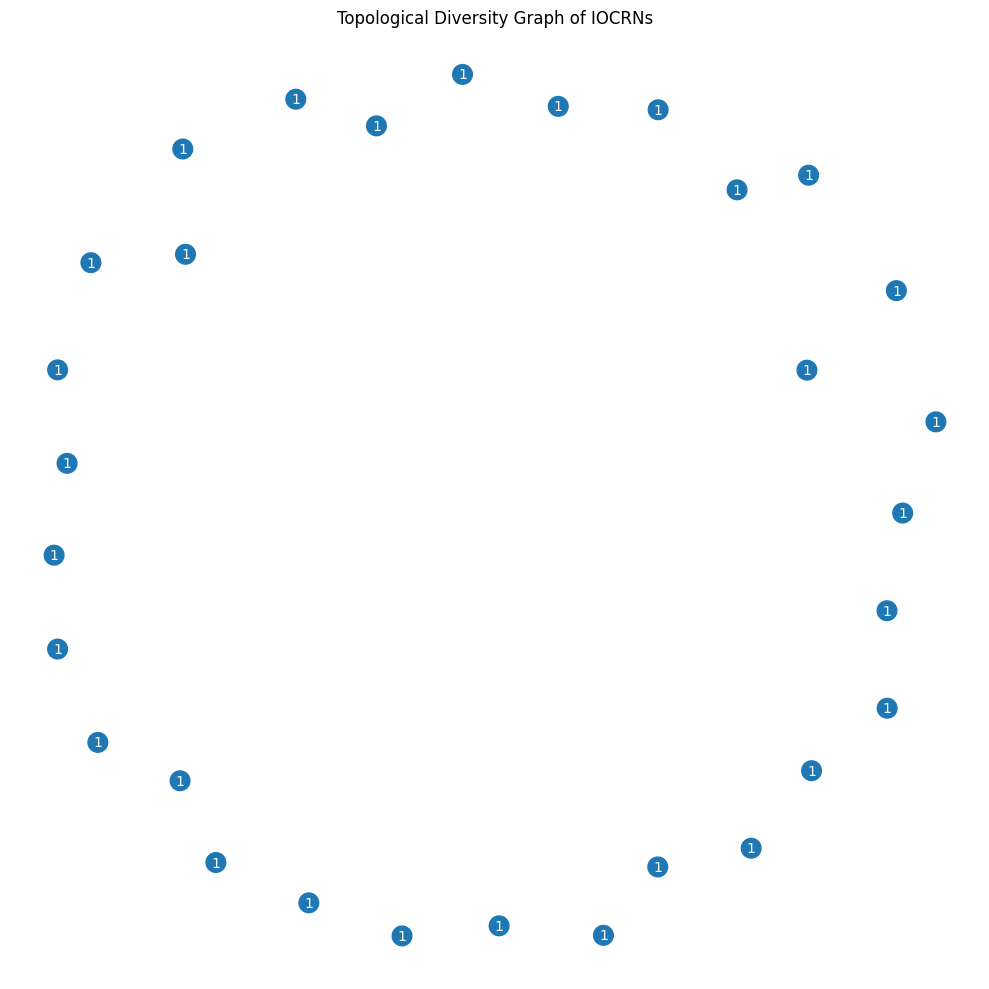

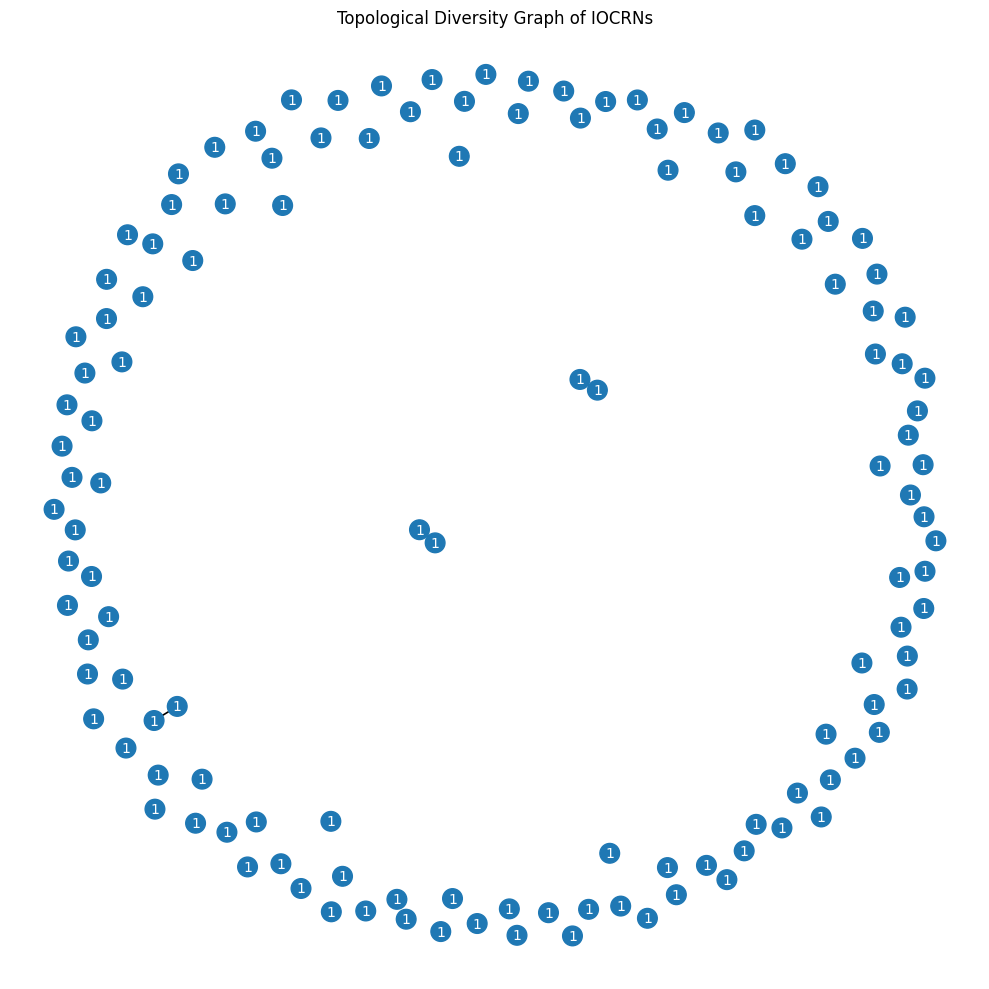

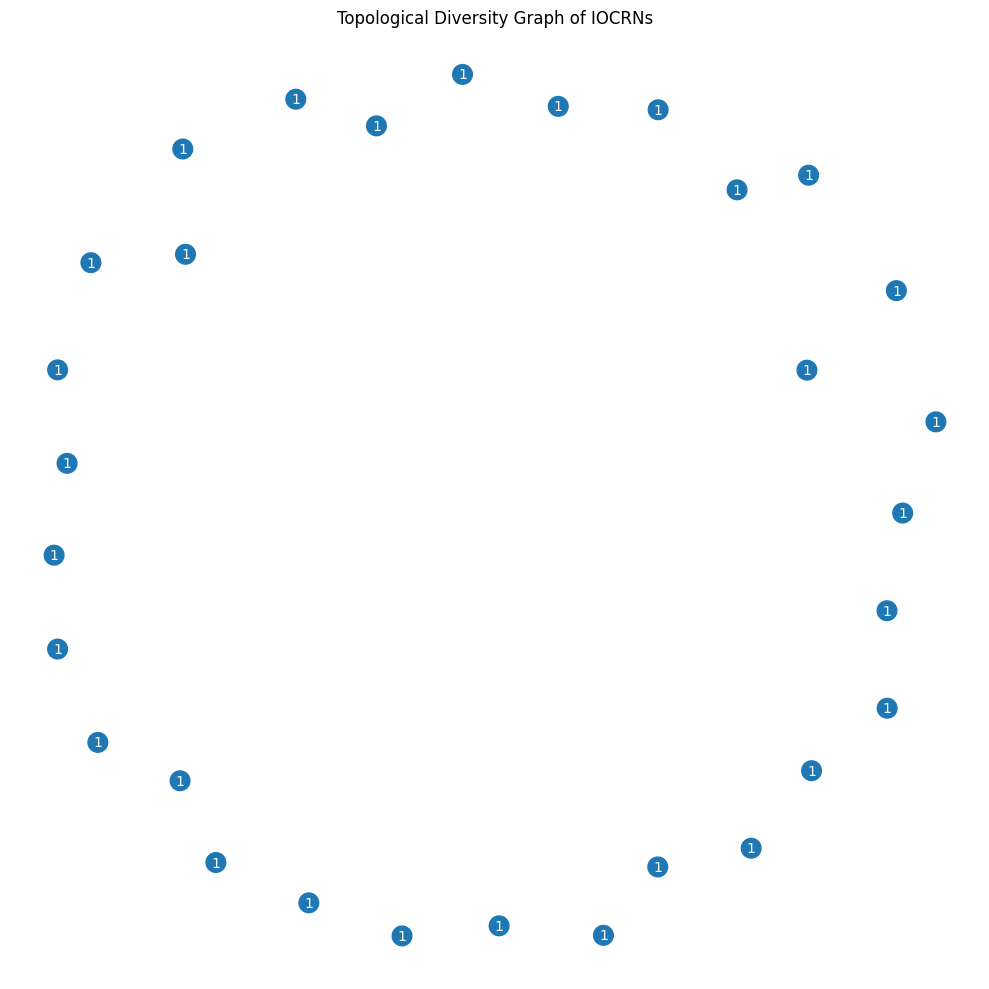

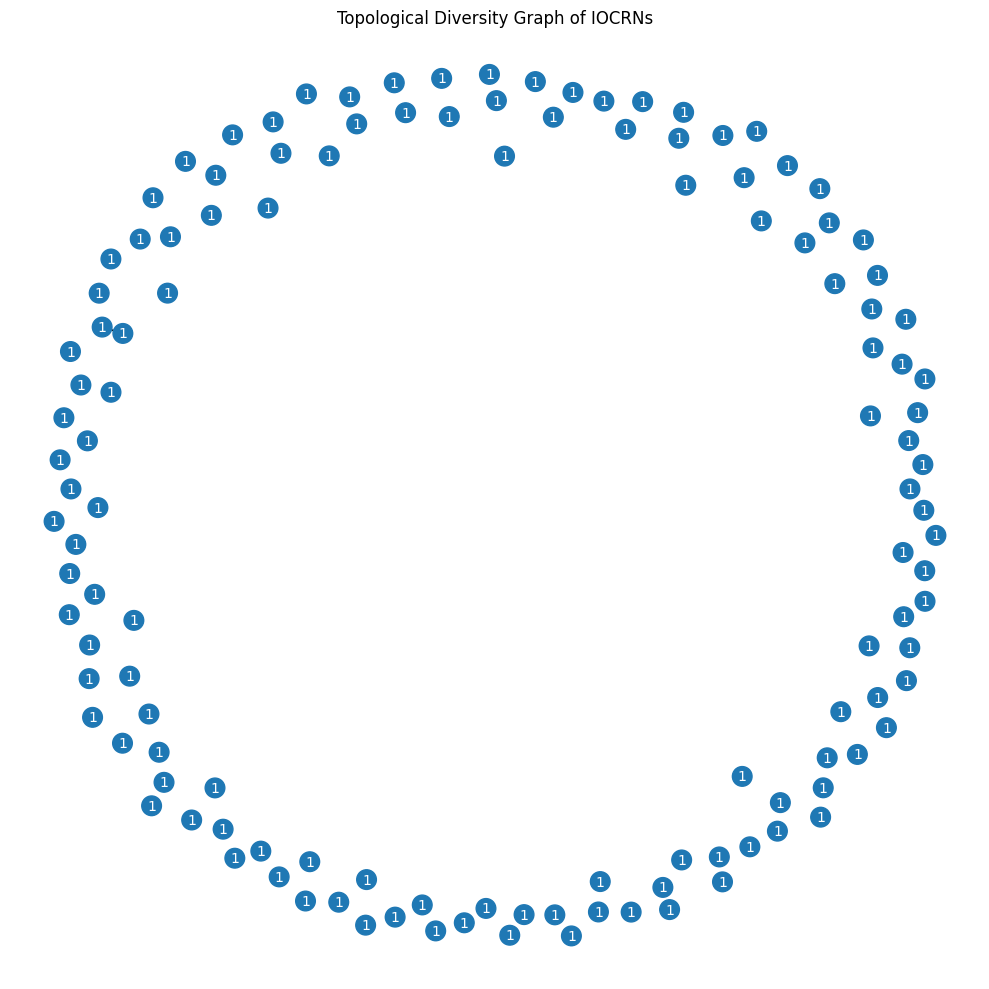

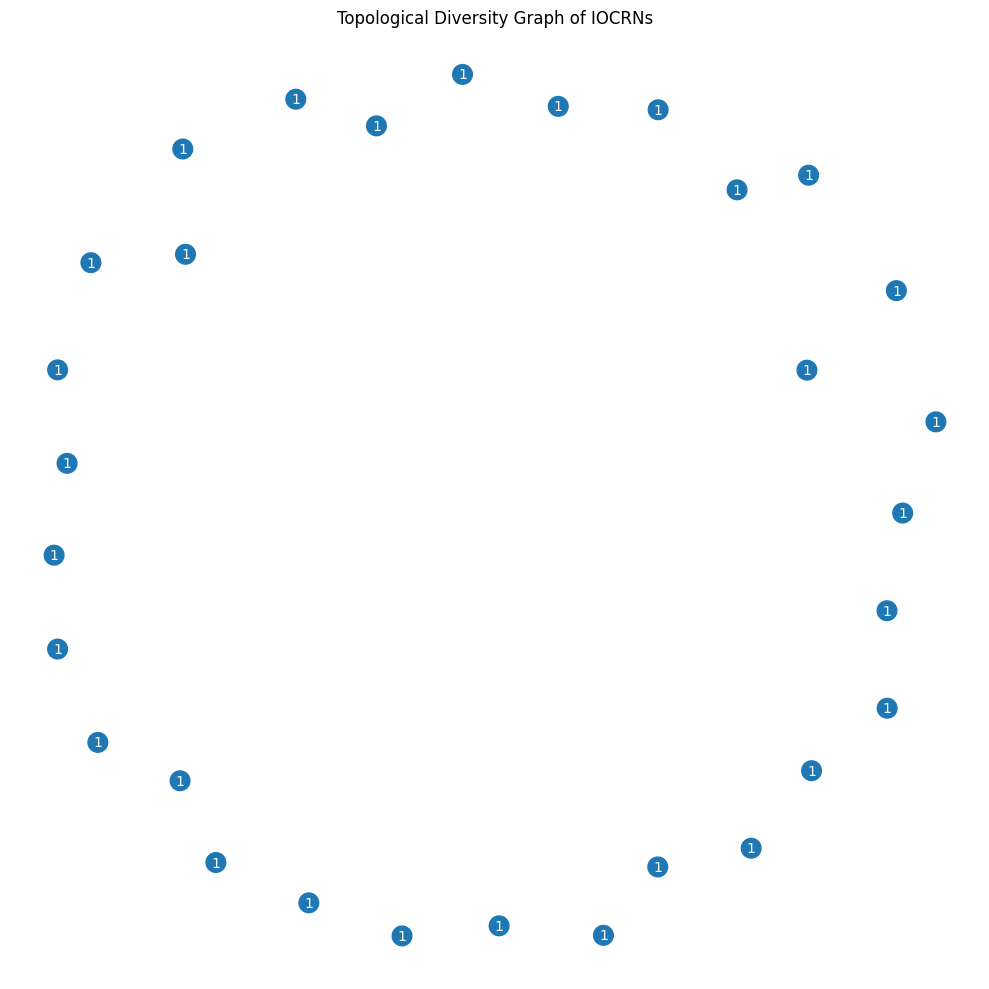

...

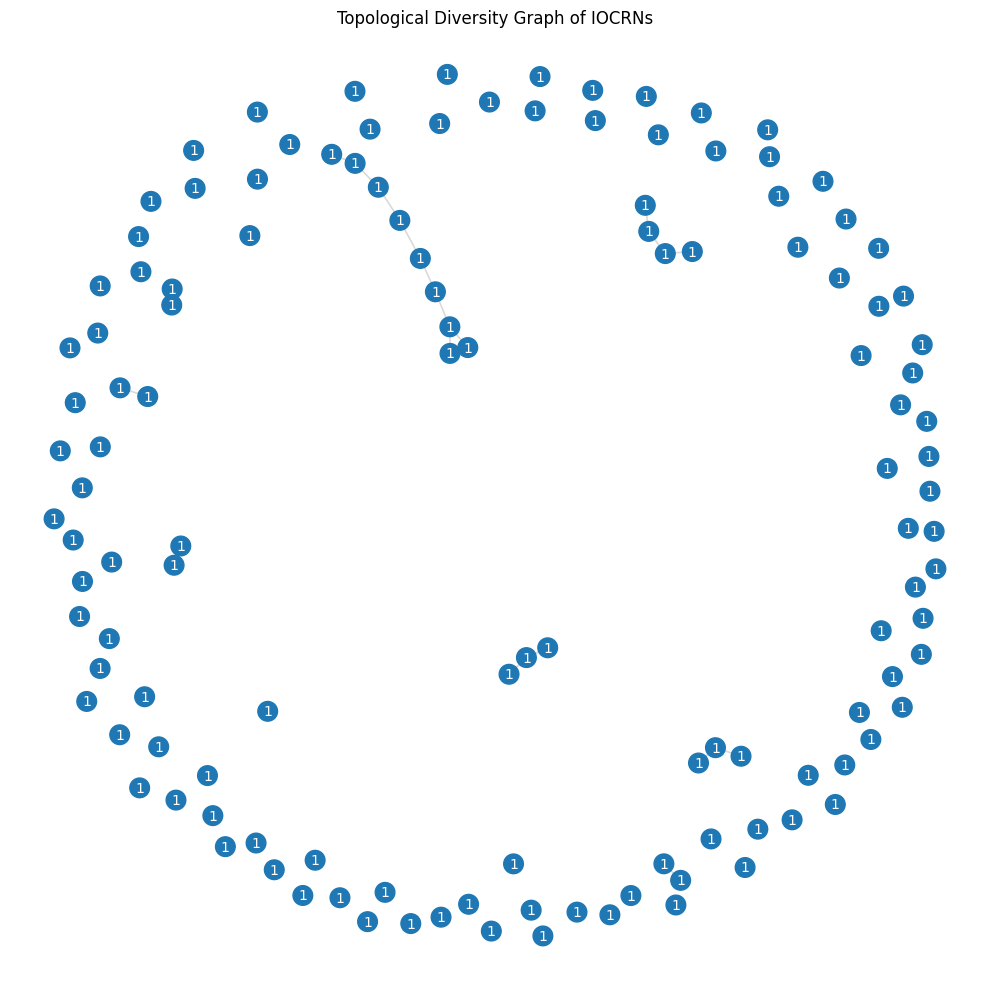

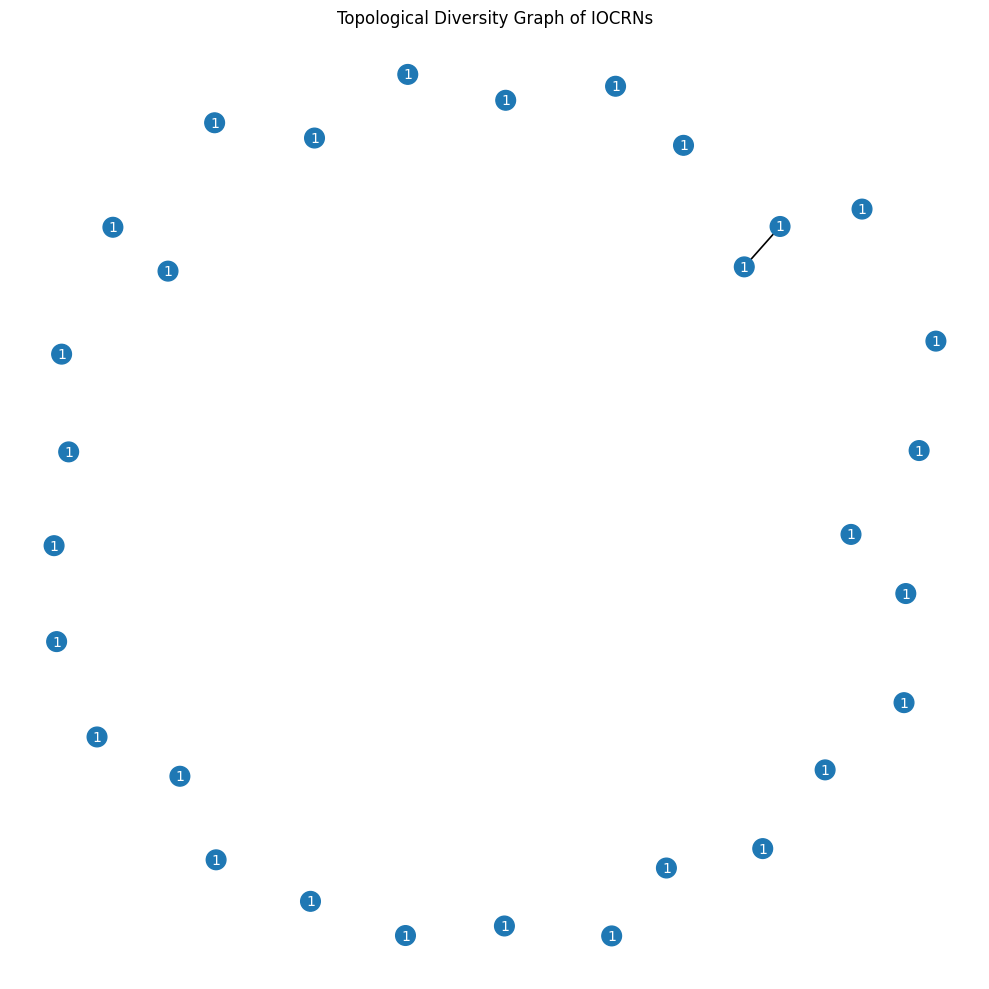

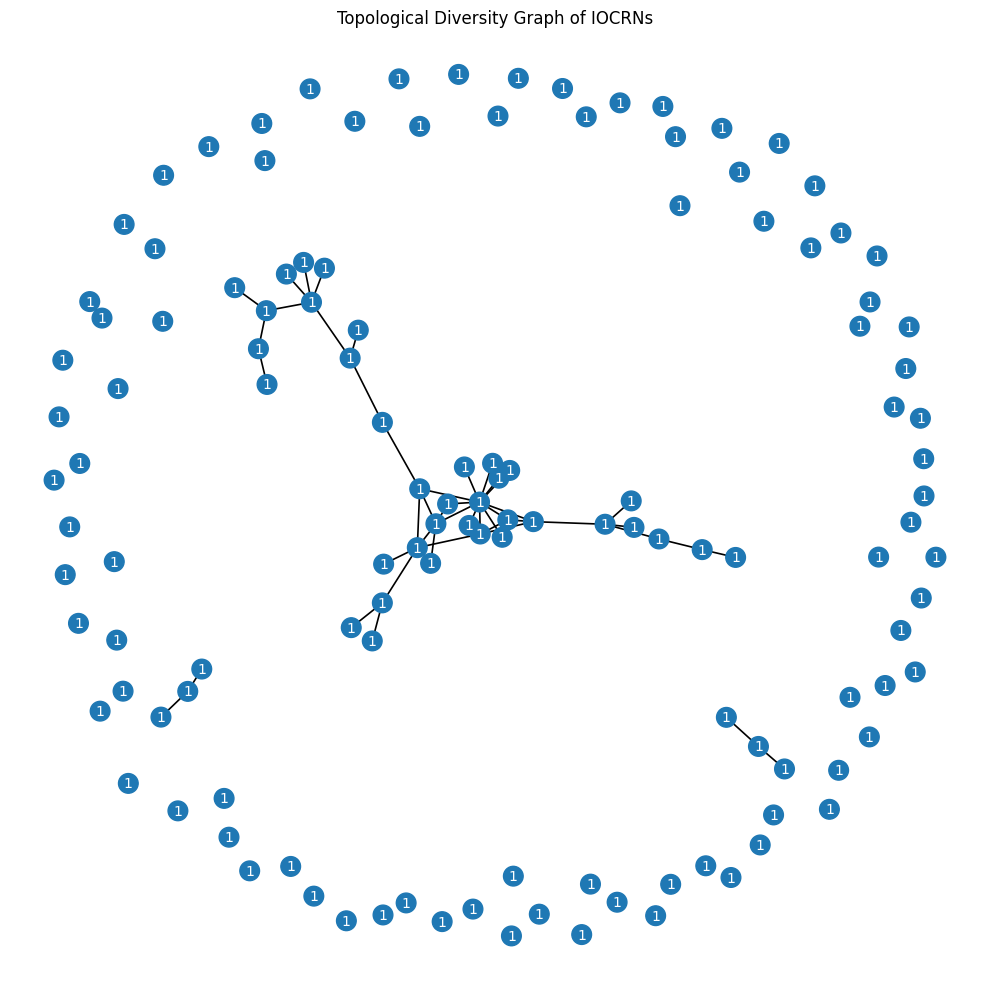

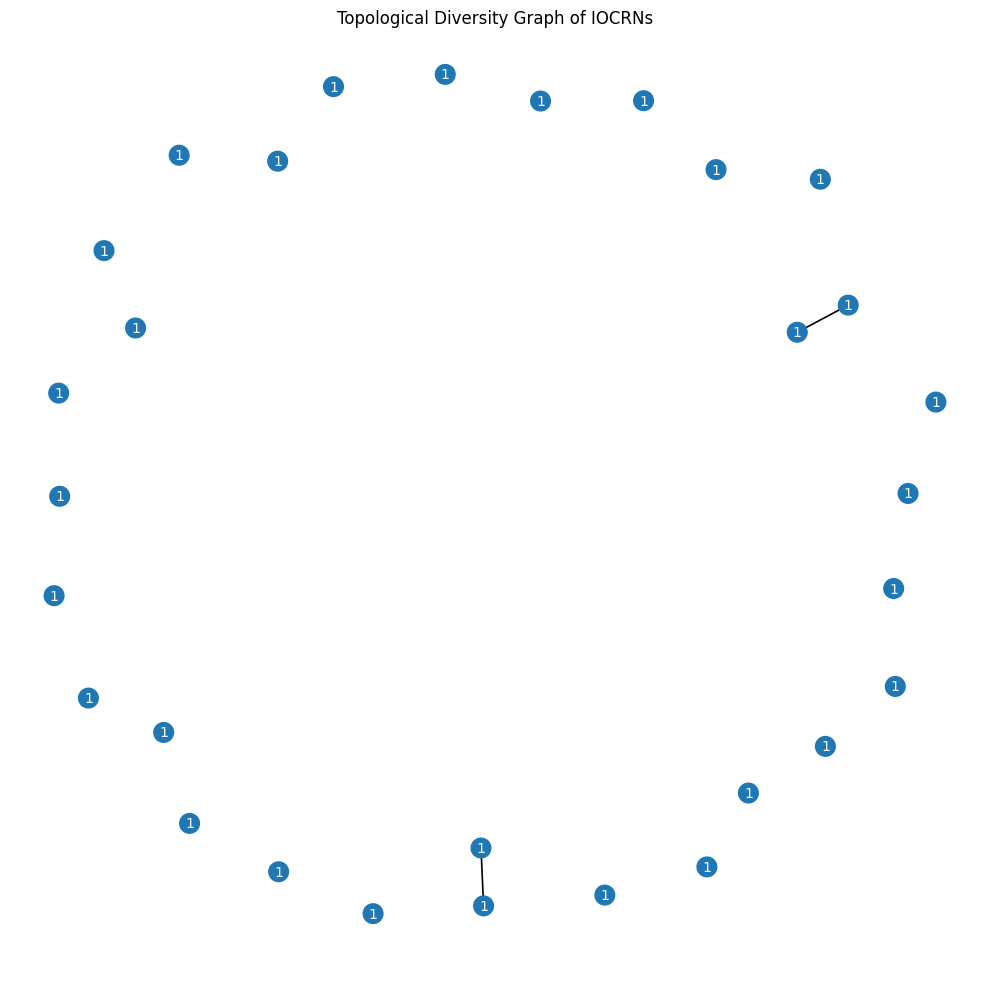

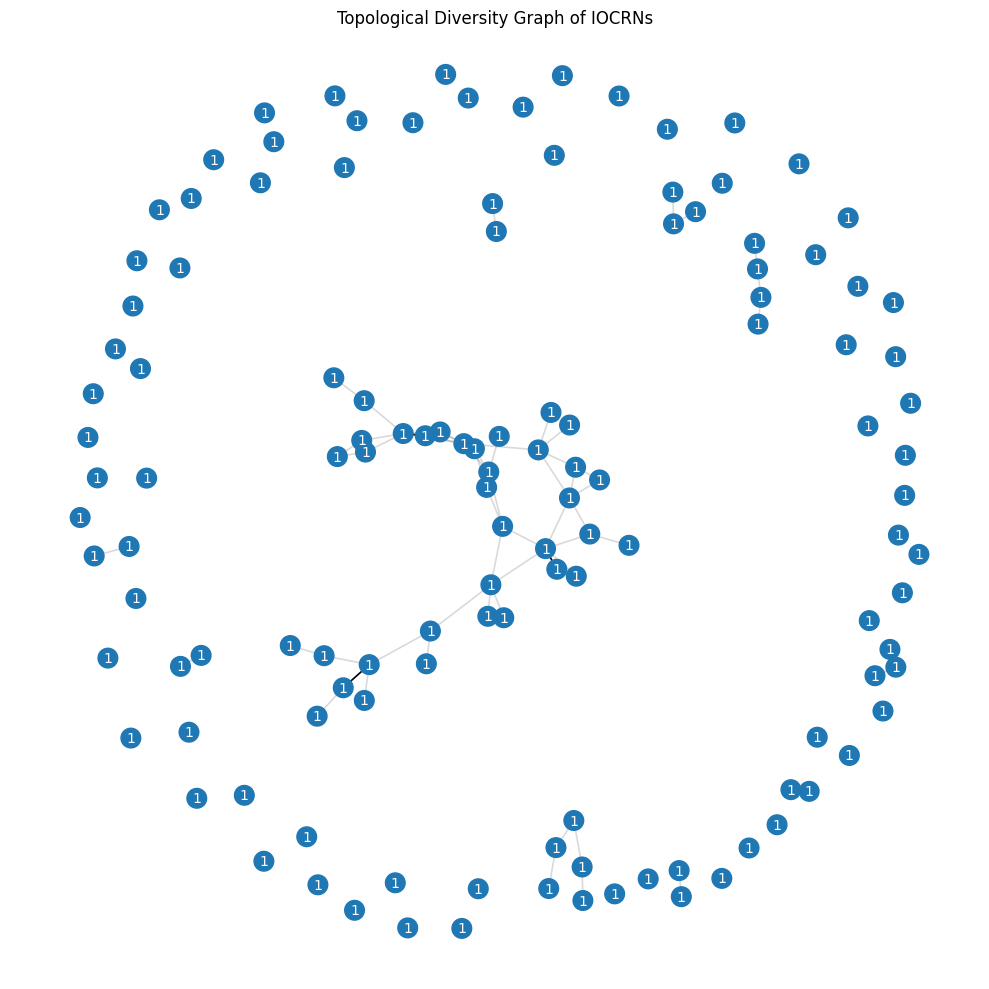

In [12]:
checkpoint_path = "active_learning_conditioning_task_chkpt.pkl"
trainer.run(epochs=cfg.train.epochs, checkpoint_path=checkpoint_path)


In [13]:
# from RL4CRN.utils.input_interface import load_session_and_trainer
# trainer_loaded = load_session_and_trainer(checkpoint_path, device="cuda")
# trainer_loaded.inspect_best()


CRN loss: 0.2695669788964874
Inputs: ['cs', 's'] 
Species: ['H', 'O', 'X1', 'X2'] 
Output Species: ['O'] 
∅ ----> X1;  [MAK(1.0, cs)]
∅ ----> X2;  [MAK(1.0, s)]
H ----> ∅;  [MAK(0.1)]
X1 + X1 ----> X2;  [MAK(0.41702431440353394)]
O + X1 ----> ∅;  [MAK(0.5591735243797302)]
H + X2 ----> H + O;  [MAK(0.4327661693096161)]
O + X2 ----> H + H;  [MAK(0.14392848312854767)]
O + O ----> H + X2;  [MAK(1.395733118057251)]


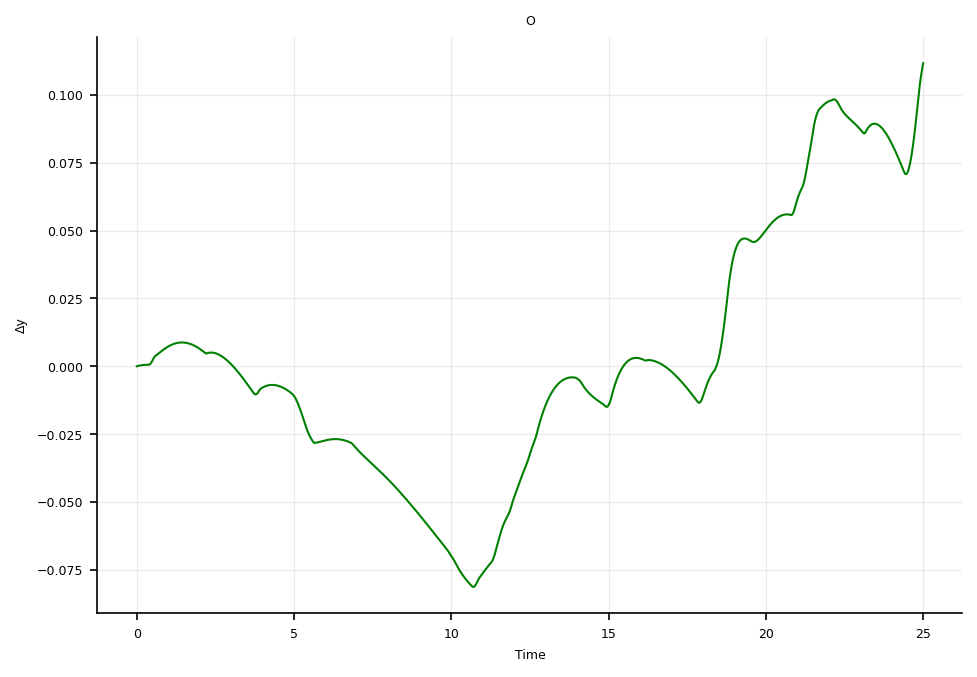

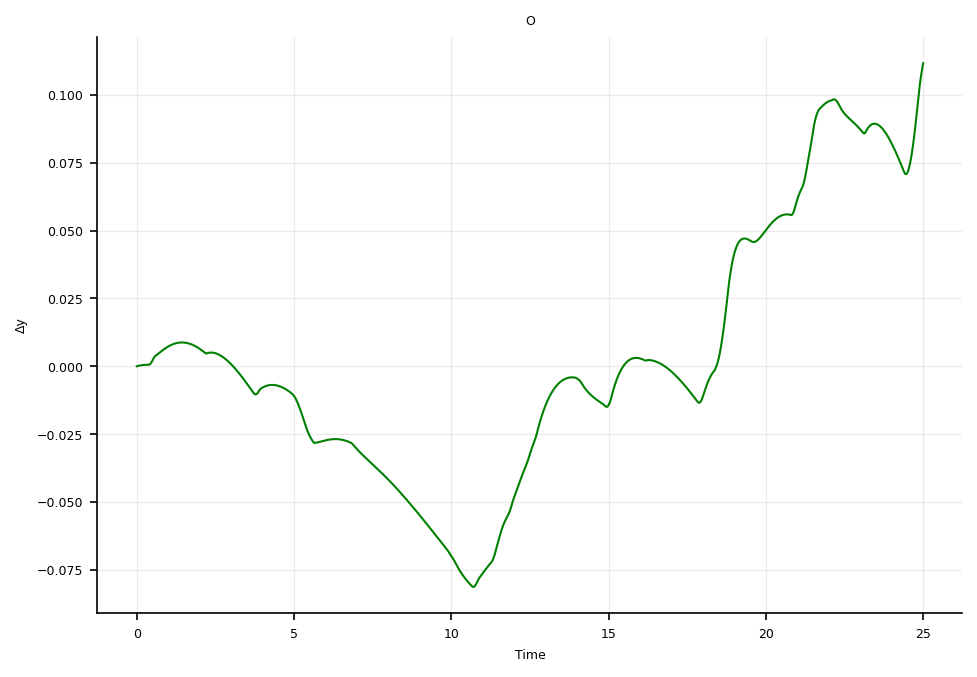

In [14]:
hof_crns = [item.state for item in trainer.s.mult_env.hall_of_fame]
crns_new = trainer.resimulate(hof_crns, ic=("constant", 0.0))

trainer.inspect(crns_new[0], plot_type="transient_response_piecewise")
crns_new[0].plot_transient_response_piecewise(); plt.show()
